In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt


In [2]:
df=pd.read_csv("gurgaon_properties_with_new_features.csv")

In [3]:
df.head()

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,...,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
0,flat,ss the leaf,sector 85,1.20,12371.0,970.010508,Super Built up area 1671(155.24 sq.m.)Built Up...,2.0,2.0,2,...,1671.0,1190.0,970.0,0.0,1.0,1.0,0.0,0.0,1,81
1,flat,tulip purple,sector 69,1.80,9000.0,2000.000000,Super Built up area 2400(222.97 sq.m.)Built Up...,4.0,5.0,3+,...,2400.0,2200.0,2000.0,0.0,1.0,0.0,0.0,0.0,1,165
2,flat,umang monsoon breeze,sector 78,1.15,5284.0,2176.381529,Super Built up area 2176(202.16 sq.m.),3.0,3.0,3,...,2176.0,NaN,NaN,0.0,1.0,0.0,0.0,1.0,1,22
3,house,independent,sector 7,2.25,16892.0,1332.000000,Built Up area: 148 (123.75 sq.m.),5.0,3.0,0,...,NaN,148.0,NaN,0.0,0.0,0.0,0.0,0.0,1,0
4,flat,tulip violet,sector 69,1.75,9459.0,1850.089862,Carpet area: 1850 (171.87 sq.m.),3.0,4.0,2,...,NaN,NaN,1850.0,0.0,0.0,0.0,0.0,0.0,0,174


# Will Analyze each column separately and then will do multivariate analysis

In [4]:
df.shape

(3803, 23)

In [5]:
df.duplicated().sum()

125

In [6]:
df.drop_duplicates(inplace=True)

In [7]:
df.head()

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,...,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
0,flat,ss the leaf,sector 85,1.20,12371.0,970.010508,Super Built up area 1671(155.24 sq.m.)Built Up...,2.0,2.0,2,...,1671.0,1190.0,970.0,0.0,1.0,1.0,0.0,0.0,1,81
1,flat,tulip purple,sector 69,1.80,9000.0,2000.000000,Super Built up area 2400(222.97 sq.m.)Built Up...,4.0,5.0,3+,...,2400.0,2200.0,2000.0,0.0,1.0,0.0,0.0,0.0,1,165
2,flat,umang monsoon breeze,sector 78,1.15,5284.0,2176.381529,Super Built up area 2176(202.16 sq.m.),3.0,3.0,3,...,2176.0,NaN,NaN,0.0,1.0,0.0,0.0,1.0,1,22
3,house,independent,sector 7,2.25,16892.0,1332.000000,Built Up area: 148 (123.75 sq.m.),5.0,3.0,0,...,NaN,148.0,NaN,0.0,0.0,0.0,0.0,0.0,1,0
4,flat,tulip violet,sector 69,1.75,9459.0,1850.089862,Carpet area: 1850 (171.87 sq.m.),3.0,4.0,2,...,NaN,NaN,1850.0,0.0,0.0,0.0,0.0,0.0,0,174


# 1. property_type Column Analysis

In [8]:
df['property_type'].value_counts()

property_type
flat     2818
house     859
Name: count, dtype: int64

<Axes: xlabel='property_type'>

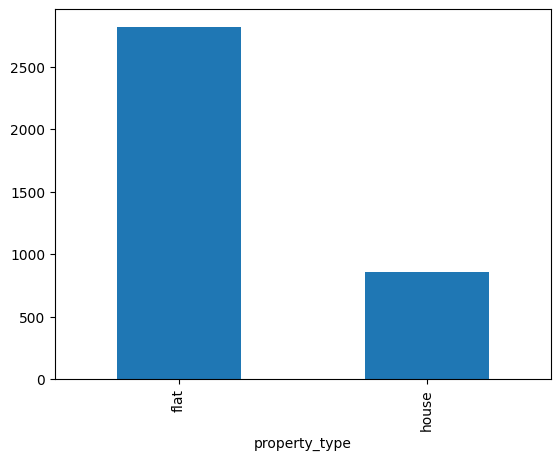

In [9]:
df['property_type'].value_counts().plot(kind='bar')

In [10]:
df['property_type'].isna().sum()

1

In [11]:
df[df['property_type'].isna()]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,...,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
3802,NaN,NaN,sector 37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0


In [12]:
print(df['property_type'].unique())
df['property_type'].replace(['None', 'N/A', 'nan', ''], np.nan, inplace=True)
df['property_type'].dropna(inplace=True) #there is some problem with dropping this nan value row, will handle it later
df['property_type'].isna().sum()


['flat' 'house' nan]


/var/folders/3t/5qtlv2451k3fkqv9ls22lmg00000gn/T/ipykernel_30884/430424212.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['property_type'].replace(['None', 'N/A', 'nan', ''], np.nan, inplace=True)


1

# Observations:
1. Approx 75% of the data is flat data and 25% is of house data
2. there is one missing value 
3.  it contains one nan value (Handle it befor applying any model)

# 2.Society Analysis

In [13]:
df['society'].value_counts()

society
independent                             486
tulip violet                             75
ss the leaf                              73
dlf new town heights                     42
shapoorji pallonji joyville gurugram     42
                                       ... 
vidya apartment                           1
signature global superbia                 1
unitech south park                        1
dlf wellington estate                     1
ansal sushant lok 2                       1
Name: count, Length: 675, dtype: int64

In [14]:
df['society'].value_counts().shape

(675,)

In [15]:
df[df['society']!='independent']['society'].value_counts(normalize=True).cumsum().head(75)

society
tulip violet                            0.023511
ss the leaf                             0.046395
dlf new town heights                    0.059561
shapoorji pallonji joyville gurugram    0.072727
signature global park                   0.083699
                                          ...   
ramsons kshitij                         0.490282
indiabulls enigma                       0.494357
ats kocoon                              0.498433
mvn athens                              0.502194
central park flower valley              0.505956
Name: proportion, Length: 75, dtype: float64

In [18]:
society_counts=df['society'].value_counts()
#frequency ditsribution for societies
freq_bins={

    "Very high(>100)":(society_counts>100).sum(),
    "High(50-100)":((society_counts>50) & (society_counts<=100)).sum(),
    "Average(10-49)":((society_counts>10) & (society_counts<50)).sum(),
    "Low(2-9)":((society_counts>1) & (society_counts<=10)).sum(),
    "Very Low(1)": (society_counts==1).sum()
}
freq_bins

{'Very high(>100)': 1,
 'High(50-100)': 2,
 'Average(10-49)': 86,
 'Low(2-9)': 279,
 'Very Low(1)': 307}

<Axes: xlabel='society'>

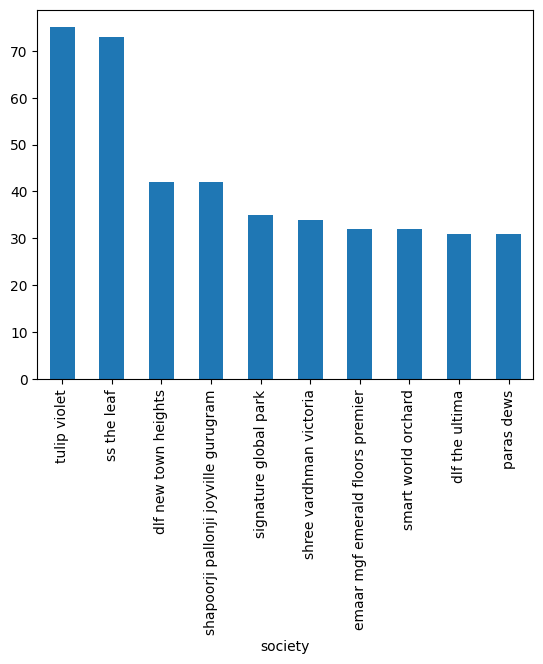

In [19]:
df[df['society']!='independent']['society'].value_counts().head(10).plot(kind='bar')

In [20]:
df['society'].isnull().sum()

2

In [21]:
df[df['society'].isnull()]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,...,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
2281,flat,NaN,sector 78,0.6,3692.0,1625.135428,Built Up area: 1625 (150.97 sq.m.),2.0,2.0,0,...,NaN,1625.0,NaN,0.0,0.0,0.0,0.0,0.0,1,0
3802,NaN,NaN,sector 37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0


In [23]:
df.drop(index=3802, inplace=True)


In [24]:
df[df['society'].isnull()]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,...,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
2281,flat,NaN,sector 78,0.6,3692.0,1625.135428,Built Up area: 1625 (150.97 sq.m.),2.0,2.0,0,...,NaN,1625.0,NaN,0.0,0.0,0.0,0.0,0.0,1,0


# Observations:

1. Approximately 13% of properties are independent.

2. There are a total of 675 societies:

   - The top 75 societies account for 50% of the properties, while the remaining 50% of properties are distributed among the remaining 600 societies.

       - Society Distribution by Property Count:
           - Very High (>100): 1 society has more than 100 listings.
           - High (50-100): 2 societies have between 50 to 100 listings each.
           - Average (10-49): 92 societies fall within this range, each with listings ranging from 10 to 49.
           - Low (2-9): 273 societies have between 2 to 9 listings.
           - Very Low (1): A significant number, 308 societies, have only 1 listing each.

   - There is 1 missing value in the dataset.


### 3. sector

In [26]:
df['sector'].value_counts()

sector
sohna road    154
sector 85     108
sector 102    106
sector 92     100
sector 69      93
             ... 
sector 88b      3
sector 73       3
sector 17b      3
sector 17a      3
sector 27       3
Name: count, Length: 114, dtype: int64

In [27]:
df['sector'].value_counts().shape

(114,)

<Axes: xlabel='sector'>

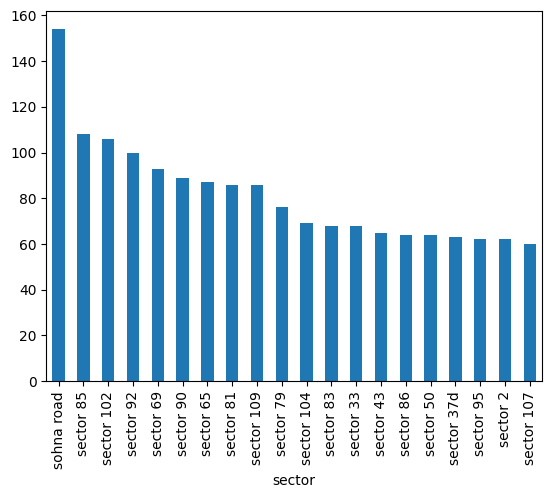

In [31]:
df['sector'].value_counts().head(20).plot(kind='bar')

In [32]:
# Frequency distribution for sectors
sector_counts = df['sector'].value_counts()

sector_frequency_bins = {
    "Very High (>100)": (sector_counts > 100).sum(),
    "High (50-100)": ((sector_counts >= 50) & (sector_counts <= 100)).sum(),
    "Average (10-49)": ((sector_counts >= 10) & (sector_counts < 50)).sum(),
    "Low (2-9)": ((sector_counts > 1) & (sector_counts < 10)).sum(),
    "Very Low (1)": (sector_counts == 1).sum()
}

sector_frequency_bins

{'Very High (>100)': 3,
 'High (50-100)': 25,
 'Average (10-49)': 62,
 'Low (2-9)': 24,
 'Very Low (1)': 0}

#### Observations

- There are a total of 114 unique sectors in the dataset.

- Frequency distribution of sectors:
    - Very High (>100): 3 sectors have more than 100 listings.
    - High (50-100): 25 sectors have between 50 to 100 listings.
    - Average (10-49): A majority, 62 sectors, fall in this range with 10 to 49 listings each.
    - Low (2-9): 24 sectors have between 2 to 9 listings.
    - Very Low (1): Interestingly, there are no sectors with only 1 listing.


# 4. Price(Numerical Feature)

In [33]:
df['price'].isnull().sum()  

16

In [34]:
df['price'].describe()

count    3661.000000
mean        2.533491
std         2.980235
min         0.070000
25%         0.950000
50%         1.520000
75%         2.750000
max        31.500000
Name: price, dtype: float64

In [39]:
import seaborn as sns

<Axes: xlabel='price', ylabel='Count'>

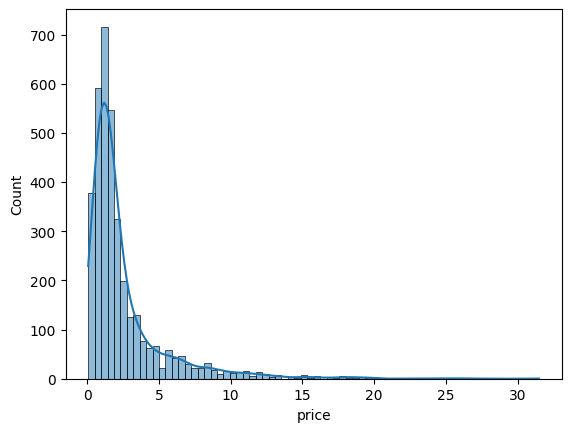

In [41]:
sns.histplot(df['price'],kde=True,bins=70)

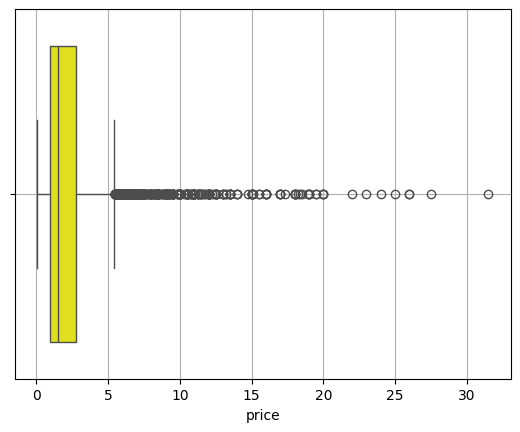

In [43]:
sns.boxplot(x=df['price'],color='yellow')
plt.grid()

# Observations about Price
### Descriptive Statistics:

- **Count:** There are 3,661 non-missing price entries.
- **Mean Price:** The average price is approximately 2.53 crores.
- **Median Price:** The median (50th percentile) price is 1.52 crores.
- **Standard Deviation:** Prices exhibit a standard deviation of 2.98, indicating variability.
- **Range:** Prices range from a minimum of 0.07 crores to a maximum of 31.5 crores.
- **Interquartile Range (IQR):** The IQR, from the 25th to the 75th percentile, spans from 0.95 crores to 2.75 crores.

### Visualizations:

- **Distribution:** The histogram suggests that most properties are priced below 5 crores, with a few exceeding 10 crores.
- **Box Plot:** The box plot illustrates data spread and identifies potential outliers. Properties priced over 10 crores may be considered outliers as they lie beyond the upper whisker.

### Missing Values:

- There are 16 missing values in the price column.


# Skewness and kurtosis

In [44]:

skewness = df['price'].skew()
kurtosis = df['price'].kurt()

print(skewness,kurtosis)

3.279729002010515 14.938587309483738


# Observation:
**Skewness**: The price distribution has a skewness of approximately 3.279, indicating a positive skew. This means that the distribution tail is skewed to the right, which aligns with our observation from the histogram where most properties have prices on the lower end with a few high-priced properties.

**Kurtosis**: The kurtosis value is approximately 14.93. A kurtosis value greater than 3 indicates a distribution with heavier tails and more outliers compared to a normal distribution.

# Quantile Analysis

In [46]:

quantiles = df['price'].quantile([0.01, 0.05,0.5, 0.95, 0.99])

quantiles

0.01     0.25
0.05     0.37
0.50     1.52
0.95     8.50
0.99    15.26
Name: price, dtype: float64

### Quantile Analysis:

- **1% Quantile:** Merely 1% of properties are priced below 0.25 crores.
- **5% Quantile:** Only 5% of properties are priced below 0.37 crores.
- **50% Quantile:** Only 5% of properties are priced below 1.52 crores.
- **95% Quantile:** The majority, 95%, of properties are priced below 8.5 crores.
- **99% Quantile:** An even smaller proportion, 99%, of properties are priced below 15.26 crores, indicating that very few properties exceed this value.


In [50]:
# Identify potential outliers using IQR method
Q1 = df['price'].describe()['25%']
Q3 = df['price'].describe()['75%']
IQR = Q3 - Q1

print("The interquartile range is: ", IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print("Lower range is :", lower_bound,"Upper Range is :", upper_bound)

outliers = df[(df['price'] < lower_bound) | (df['price'] > upper_bound)]
print("Number of Outliers are:", outliers.shape[0])

outliers['price'].describe()

The interquartile range is:  1.8
Lower range is : -1.7500000000000002 Upper Range is : 5.45
Number of Outliers are: 425


count    425.000000
mean       9.235624
std        4.065259
min        5.460000
25%        6.460000
50%        8.000000
75%       10.750000
max       31.500000
Name: price, dtype: float64

Outliers Analysis (using IQR method):

- Based on the IQR method, there are 425 properties considered as outliers.
- These outliers have an average price of approximately 9.23 crores.
- The range for these outliers is from 5.46 crores to 31.5 crores.

<Axes: xlabel='price'>

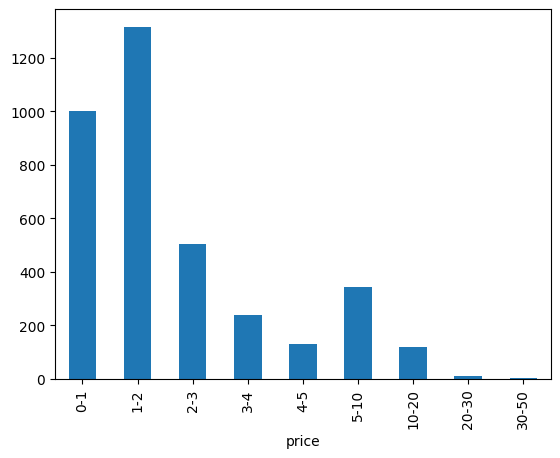

In [52]:
bins=[0,1,2,3,4,5,10,20,30,50]
labels=["0-1", "1-2", "2-3", "3-4","4-5", "5-10", "10-20", "20-30","30-50"]
pd.cut(df['price'],bins=bins,labels=labels,right=False).value_counts().sort_index().plot(kind='bar')

- The majority of properties are priced in the "1-2 crores" and "0-1 crores" ranges.
- There's a significant drop in the number of properties priced above "10 crores."

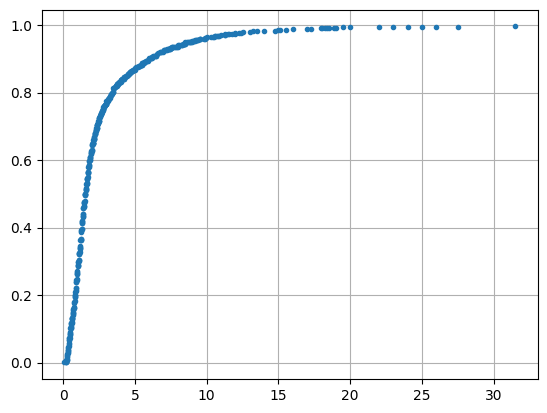

In [53]:
# ecdf plot
ecdf = df['price'].value_counts().sort_index().cumsum() / len(df['price'])
plt.plot(ecdf.index, ecdf, marker='.', linestyle='none')
plt.grid()

# Observations are same as we got from previous analysis

# Analsyis after data transformations

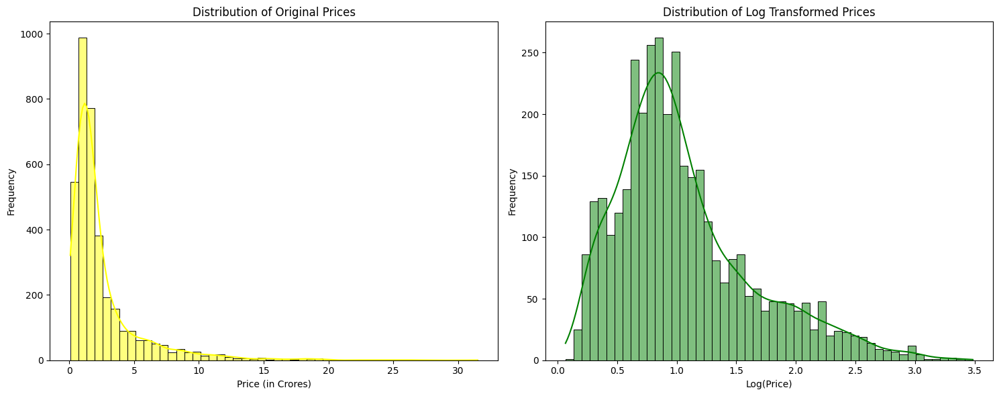

In [54]:
plt.figure(figsize=(15, 6))

# Distribution plot without log transformation
plt.subplot(1, 2, 1)
sns.histplot(df['price'], kde=True, bins=50, color='yellow')
plt.title('Distribution of Original Prices')
plt.xlabel('Price (in Crores)')
plt.ylabel('Frequency')

# Distribution plot with log transformation
plt.subplot(1, 2, 2)
sns.histplot(np.log1p(df['price']), kde=True, bins=50, color='green')
plt.title('Distribution of Log Transformed Prices')
plt.xlabel('Log(Price)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

np.log1p(x): This function computes the natural logarithm of 1+x. 
It's designed to provide more accurate results for values of x that are very close to zero. To avoid the negative values.

Using np.log1p helps in transforming the price column while ensuring that any value (including zero, if present) is handled appropriately. When we need to reverse the transformation, we can use np.expm1 which computes e^x-1

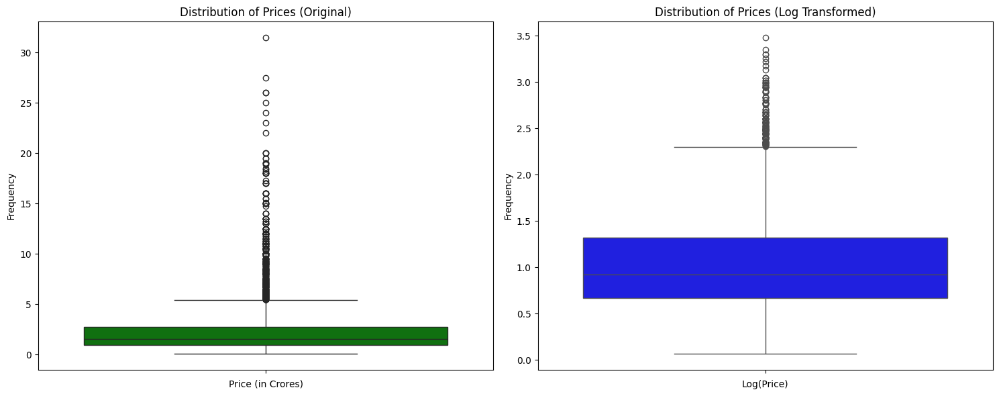

In [56]:
plt.figure(figsize=(15, 6))

# Distribution plot without log transformation
plt.subplot(1, 2, 1)
sns.boxplot(df['price'], color='green')
plt.title('Distribution of Prices (Original)')
plt.xlabel('Price (in Crores)')
plt.ylabel('Frequency')

# Distribution plot with log transformation
plt.subplot(1, 2, 2)
sns.boxplot(np.log1p(df['price']), color='blue')
plt.title('Distribution of Prices (Log Transformed)')
plt.xlabel('Log(Price)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

After log transformation lots og the outliers came under maximum whisk

# Comparing the skewness and kurtosis

In [55]:
skewness = np.log1p(df['price']).skew()
kurtosis = np.log1p(df['price']).kurt()

print(skewness,kurtosis)

1.0742084800072078 0.9657391533168251


Skewness and kurtosis got reduced

# Price_Per_sqr_ft (numerical column)

In [57]:
df['price_per_sqft'].isnull().sum()

16

In [58]:
df['price_per_sqft'].describe()

count      3661.000000
mean      13890.704179
std       23207.200490
min           4.000000
25%        6815.000000
50%        9020.000000
75%       13878.000000
max      600000.000000
Name: price_per_sqft, dtype: float64

<Axes: xlabel='price_per_sqft', ylabel='Count'>

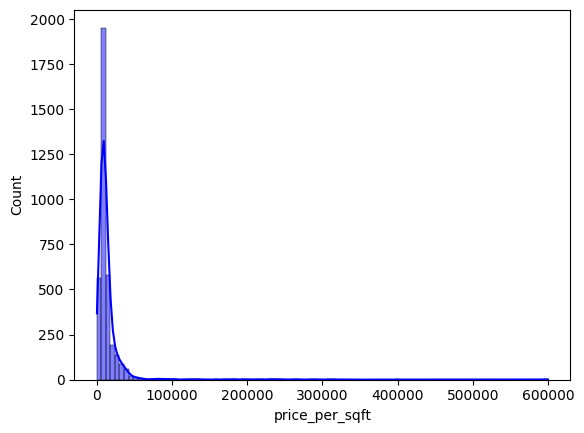

In [60]:
sns.histplot(df['price_per_sqft'], bins=100, color='blue', kde=True)

# Observation: 
The majority of properties exhibit a price_per_sqft falling within the range of approximately ₹0 to ₹50,000. While there is notable clustering in the lower range, some properties demonstrate remarkably high price_per_sqft values.


<Axes: ylabel='price_per_sqft'>

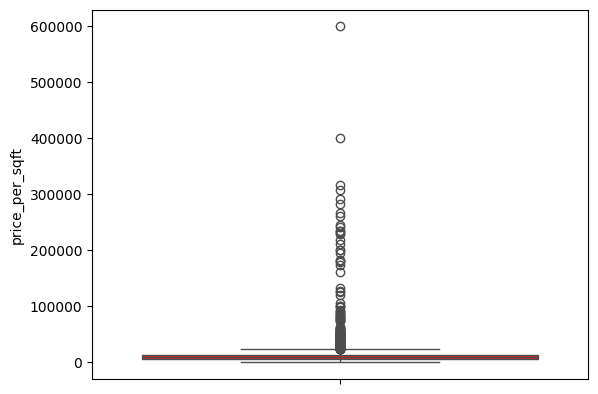

In [63]:
sns.boxplot(df['price_per_sqft'], color='red')

The box plot illustrates numerous outliers, particularly towards the higher end.
 Although the interquartile range (IQR) appears relatively tight, there are numerous data points extending beyond the "whiskers" of the box plot, suggesting the presence of potential outliers.


#### Observations

- Potential Outliers
- Right Skewed
- 16 missing values

### bedRoom (categorical)

<Axes: xlabel='bedRoom'>

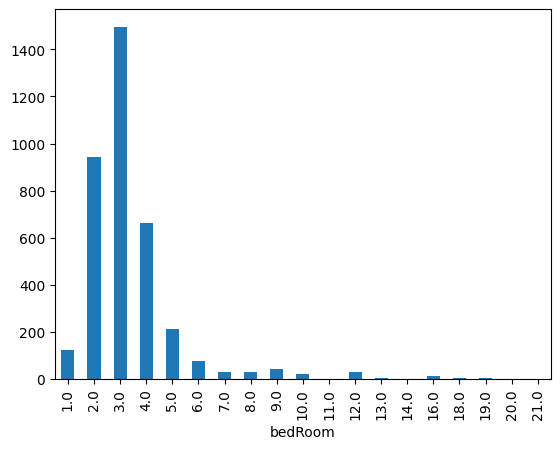

In [64]:
df['bedRoom'].value_counts().sort_index().plot(kind='bar')

<Axes: ylabel='proportion'>

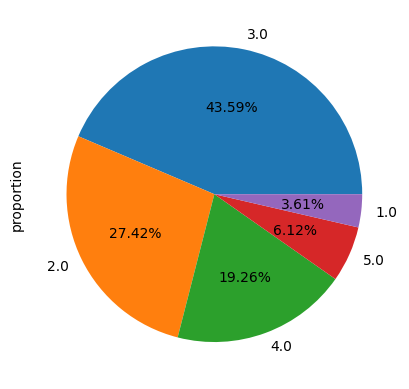

In [66]:
df['bedRoom'].value_counts(normalize=True).head().plot(kind='pie',autopct='%0.2f%%')

# Observations:
1. 43.59% of houses has 3 number of bedrooms.
2. 27.42% 2 rooms and 19.26% 4 rooms, only 3.61% of the houses  have 1 bedroom.
3. surprisingly there are houses with 16 and 19 number of rooms. 


# Bathrooms (categorical data)

In [67]:
df['bathroom'].isnull().sum()

0

<Axes: xlabel='bathroom'>

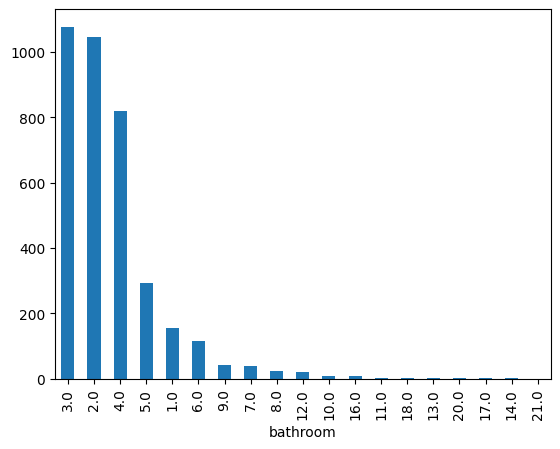

In [68]:
df['bathroom'].value_counts().plot(kind='bar')

<Axes: xlabel='bathroom'>

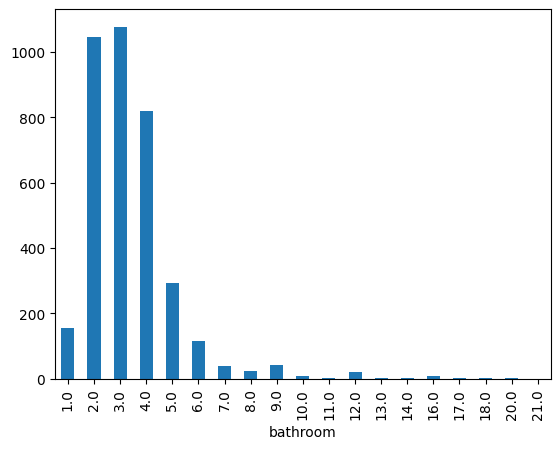

In [70]:
df['bathroom'].value_counts().sort_index().plot(kind='bar')

<Axes: ylabel='proportion'>

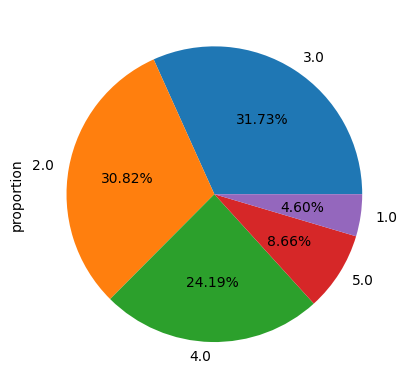

In [71]:
df['bathroom'].value_counts(normalize=True).head().plot(kind='pie',autopct='%0.2f%%')

# Observations:
1. 31.73% of houses has 3 number of bathrooms.
2. 30.82% 2 bathrooms and 24.19% has 4 rooms, only 4.60% of the houses  have 1 bedroom.
3. there are houses with 20 number of rooms. (Probabily they are villas constructed ober the flate on top floor with 2-3 stories.)


# Balcony

In [72]:
df['balcony'].isnull().sum()

0

<Axes: xlabel='balcony'>

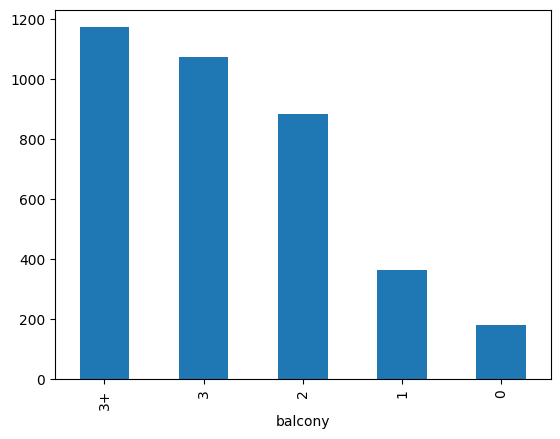

In [73]:
df['balcony'].value_counts().plot(kind='bar')

<Axes: ylabel='proportion'>

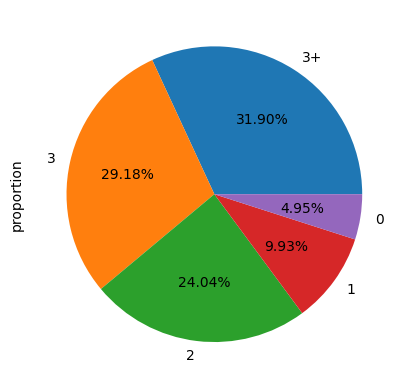

In [74]:
df['balcony'].value_counts(normalize=True).head().plot(kind='pie',autopct='%0.2f%%')

# Observations:
1. 31.90% of houses has 3+(>3) balcony.
2. 29.18% of houses has 3 and 24.04% has 2 balcony.
3. there are houses without any balcony. 


# Floornumber

In [75]:
df['floorNum'].isnull().sum()

19

In [76]:
df['floorNum'].describe()

count    3658.000000
mean        6.795790
std         6.012576
min         0.000000
25%         2.000000
50%         5.000000
75%        10.000000
max        51.000000
Name: floorNum, dtype: float64

<Axes: ylabel='floorNum'>

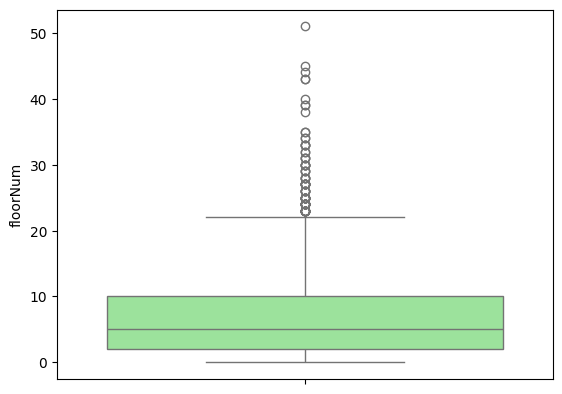

In [78]:
sns.boxplot(df['floorNum'], color='lightgreen')

<Axes: xlabel='floorNum'>

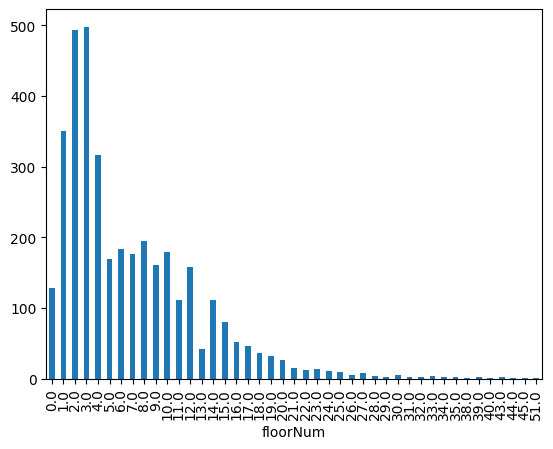

In [77]:
df['floorNum'].value_counts().sort_index().plot(kind='bar')

# Observations
1. The bulk of properties are situated between the ground floor (0) and the 20th floor. Floors 1 to 4 are notably common, with 2nd and 3rd floors being the most prevalent. While there are some properties located at higher floors, their occurrence is much lower. 

2. The box plot illustrates that most properties are clustered around the lower floors. The interquartile range (IQR) spans approximately from the 2nd to the 10th floors. Data points extending beyond the "whiskers" of the box plot, particularly on the higher side, suggest the presence of potential outliers.


### facing (Categorical)

In [79]:
df['facing'].isnull().sum()

1045

In [80]:
df['facing'].fillna('NA',inplace=True)

/var/folders/3t/5qtlv2451k3fkqv9ls22lmg00000gn/T/ipykernel_30884/3692945726.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['facing'].fillna('NA',inplace=True)


In [81]:
df['facing'].value_counts()

facing
NA            1045
North-East     624
East           622
North          387
West           249
South          231
North-West     193
South-East     173
South-West     153
Name: count, dtype: int64

# Observation
In indian Household facing is an important feature to be considered and affect the pricing of the hoiuse accordingly.
1. 1045 houses have no info about the fcaing of the enterence.
2. data shows maximum number of houses faces northeast and esat direction.


# AgePossession (Categorical)

In [82]:
df['agePossession'].isnull().sum()

0

In [83]:
df['agePossession'].value_counts()

agePossession
Relatively New        1646
New Property           593
Moderately Old         563
Undefined              307
Old Property           303
Under Construction     265
Name: count, dtype: int64

 around 1646 houses are Relatively new

# About the area of the house 

In [84]:
# super built up area
df['super_built_up_area'].isnull().sum()

1802

In [85]:
df['super_built_up_area'].describe()

count     1875.000000
mean      1925.237627
std        764.172177
min         89.000000
25%       1479.500000
50%       1828.000000
75%       2215.000000
max      10000.000000
Name: super_built_up_area, dtype: float64

<Axes: xlabel='super_built_up_area', ylabel='Count'>

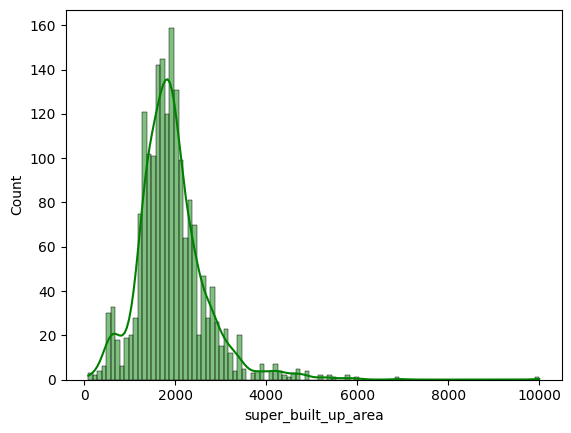

In [89]:
sns.histplot(df['super_built_up_area'].dropna(), bins=100, color='green', kde=True)   # care should be taken about the nan values

<Axes: ylabel='super_built_up_area'>

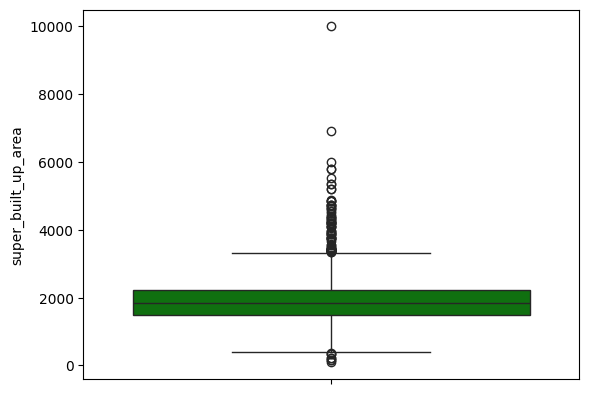

In [88]:
sns.boxplot(df['super_built_up_area'].dropna(), color='green')

- Most properties have a super built-up area ranging between approximately 500 sq.ft and 3000 sq.ft.
- There are a few properties with a significantly larger area, leading to a right-skewed distribution.
- The interquartile range (IQR) lies between roughly 1600 sq.ft and 2,200 sq.ft, indicating that the middle 50% of the properties fall within this range.
- There are several data points beyond the upper "whisker" of the box plot, indicating potential outliers. These are properties with an unusually large super built-up area.

In [90]:
# built up area
df['built_up_area'].isnull().sum()

1986

In [91]:
df['built_up_area'].describe()

count      1691.000000
mean       2379.855133
std       17937.574326
min           2.000000
25%        1100.000000
50%        1650.000000
75%        2400.000000
max      737147.000000
Name: built_up_area, dtype: float64

<Axes: ylabel='built_up_area'>

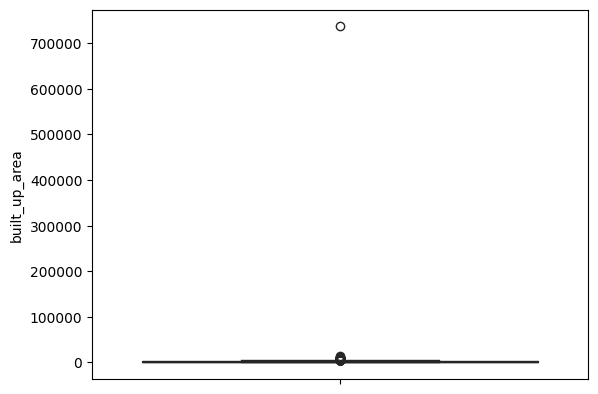

In [95]:
sns.boxplot(df['built_up_area'].dropna(), color='green')

<Axes: xlabel='built_up_area', ylabel='Count'>

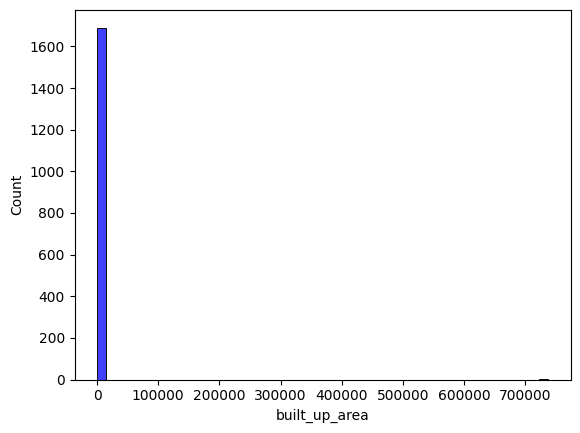

In [93]:
sns.histplot(df['built_up_area'].dropna(), bins=50, color='blue', kde=False)

- Most properties have a built-up area ranging roughly between 1000 sq.ft and 3000 sq.ft.
- There are very few properties with a much larger built-up area, leading to a highly right-skewed distribution.
- The box plot confirms the presence of significant outliers on the higher side. The data's interquartile range (IQR) is relatively compact, but the "whiskers" of the box plot are stretched due to the outliers.


The presence of extreme values, especially on the higher side, suggests that there may be outliers or data errors. This could also be due to some properties being exceptionally large, like a commercial complex or an entire building being listed.

In [96]:
# carpet area
df['carpet_area'].isnull().sum()

1806

In [97]:
df['carpet_area'].describe()

count      1871.00000
mean       2530.22281
std       22805.88715
min          15.00000
25%         845.00000
50%        1300.00000
75%        1790.00000
max      607936.00000
Name: carpet_area, dtype: float64

<Axes: ylabel='carpet_area'>

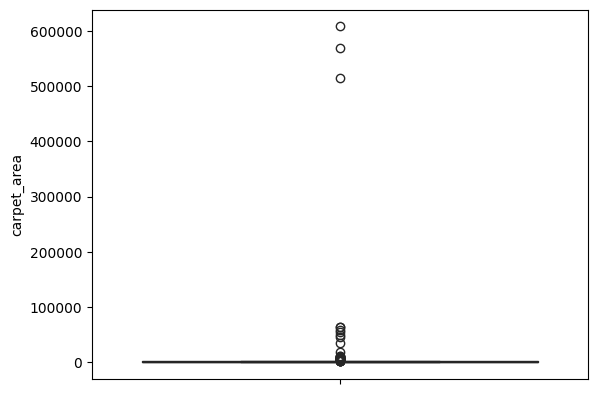

In [102]:
sns.boxplot(df['carpet_area'].dropna(), color='green')

<Axes: xlabel='carpet_area', ylabel='Count'>

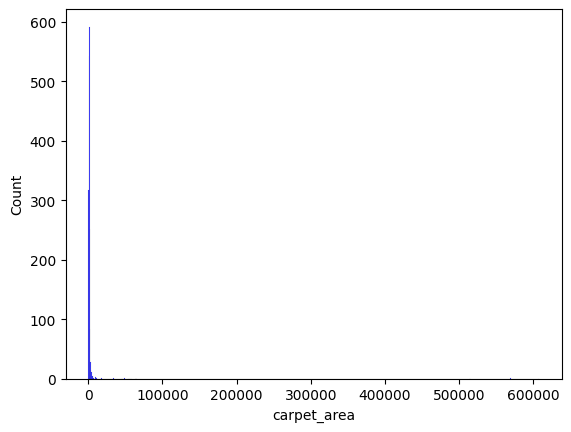

In [100]:
sns.histplot(df['carpet_area'].dropna(), bins=1000, color='blue', kde=False)

# Observation
data containms lots of outliers

# Observations about the rooms data

In [103]:
df.iloc[:,15:]

,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
0,970.00,0.0,1.0,1.0,0.0,0.0,1,81
1,2000.00,0.0,1.0,0.0,0.0,0.0,1,165
2,NaN,0.0,1.0,0.0,0.0,1.0,1,22
3,NaN,0.0,0.0,0.0,0.0,0.0,1,0
4,1850.00,0.0,0.0,0.0,0.0,0.0,0,174
...,...,...,...,...,...,...,...,...
3797,NaN,1.0,0.0,0.0,0.0,0.0,2,49
3798,1200.00,0.0,0.0,1.0,0.0,0.0,1,174
3799,NaN,0.0,0.0,0.0,0.0,0.0,0,29
3800,NaN,0.0,0.0,0.0,0.0,0.0,1,128


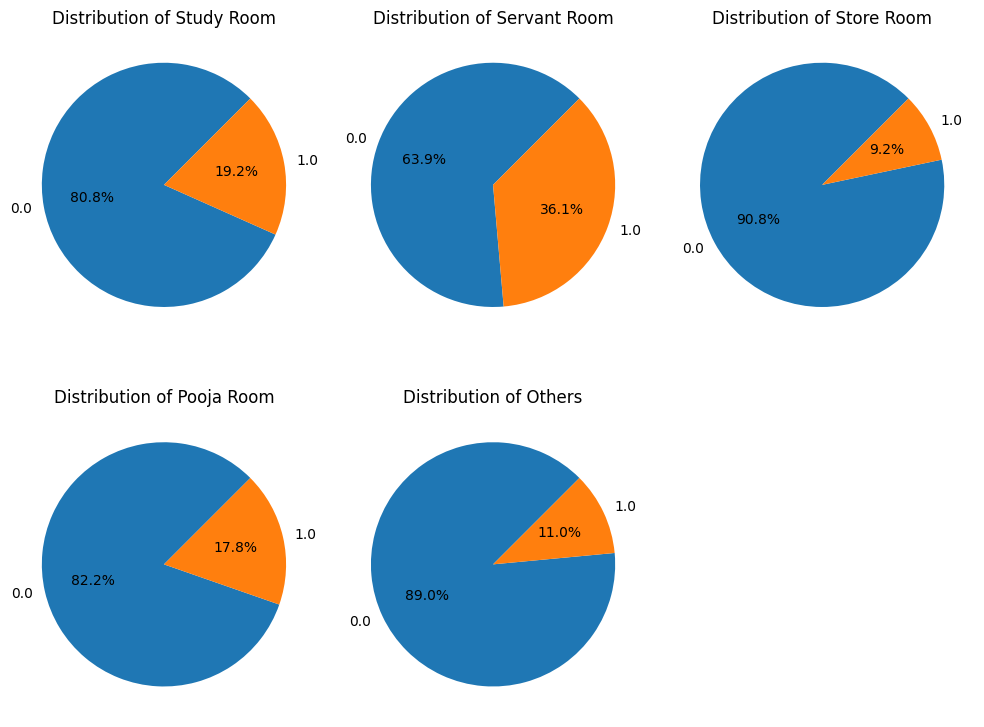

In [110]:
plt.figure(figsize=(10, 8))

# Create a subplot of pie charts for each room type
for idx, room in enumerate(['study room','servant room','store room','pooja room','others'], 1):
    ax = plt.subplot(2, 3, idx)
    df[room].value_counts().plot.pie(autopct='%1.1f%%', startangle=45, ax=ax)
    plt.title(f'Distribution of {room.title()}')
    plt.ylabel('')

plt.tight_layout()
plt.show()

# Observations
1. around 36% of the properties have servant room.
2. around 19.2% of the properties have study room.
3. around 9.2% of the properties have store room.
4. around 17.8% of the properties have Pooja room.
5. around 11% of the properties have some other types of rooms.

# Analysis about Furnishing type 

In [111]:
df['furnishing_type'].value_counts()

furnishing_type
1    2403
0    1062
2     212
Name: count, dtype: int64

<Axes: ylabel='count'>

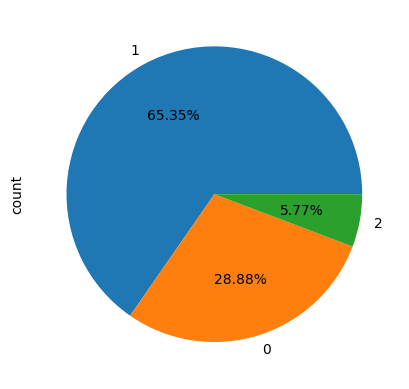

In [112]:
df['furnishing_type'].value_counts().plot(kind='pie',autopct='%0.2f%%')

# Luxury_Score (Numerical values)

In [113]:
df['luxury_score'].isnull().sum()

0

In [114]:
df['luxury_score'].describe()

count    3677.000000
mean       71.498504
std        53.057454
min         0.000000
25%        31.000000
50%        59.000000
75%       110.000000
max       174.000000
Name: luxury_score, dtype: float64

<Axes: ylabel='luxury_score'>

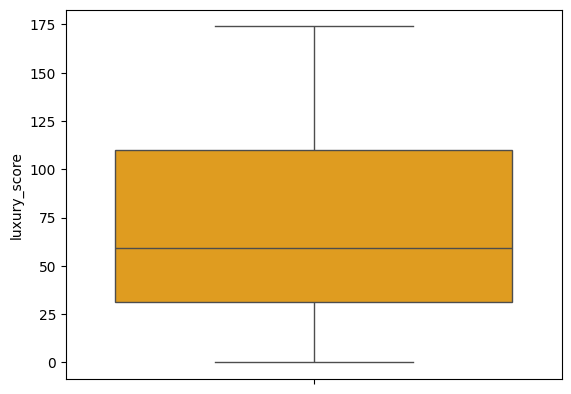

In [119]:
sns.boxplot(df['luxury_score'], color='orange')

<Axes: xlabel='luxury_score', ylabel='Count'>

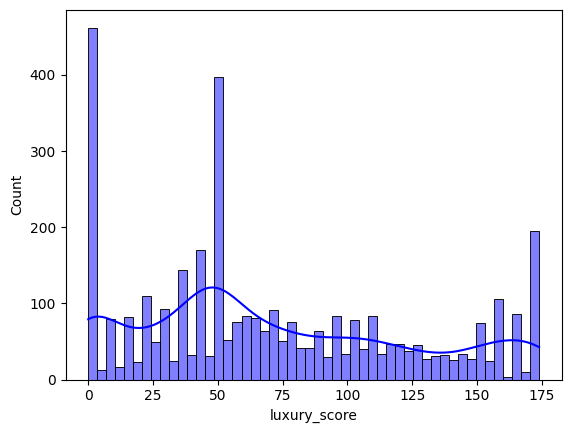

In [116]:
sns.histplot(df['luxury_score'], bins=50, color='blue', kde=True)

# Observation:
The luxury score distribution has multiple peaks, suggesting a multi-modal distribution. There's a significant number of properties with lower luxury scores (around 0-50), and another peak is observed around the 150-175 range.

The box plot reveals that the majority of the properties have luxury scores between approximately 30 and 115. The interquartile range (IQR) lies between these values.

In [120]:
df.head()

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,...,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
0,flat,ss the leaf,sector 85,1.20,12371.0,970.010508,Super Built up area 1671(155.24 sq.m.)Built Up...,2.0,2.0,2,...,1671.0,1190.0,970.0,0.0,1.0,1.0,0.0,0.0,1,81
1,flat,tulip purple,sector 69,1.80,9000.0,2000.000000,Super Built up area 2400(222.97 sq.m.)Built Up...,4.0,5.0,3+,...,2400.0,2200.0,2000.0,0.0,1.0,0.0,0.0,0.0,1,165
2,flat,umang monsoon breeze,sector 78,1.15,5284.0,2176.381529,Super Built up area 2176(202.16 sq.m.),3.0,3.0,3,...,2176.0,NaN,NaN,0.0,1.0,0.0,0.0,1.0,1,22
3,house,independent,sector 7,2.25,16892.0,1332.000000,Built Up area: 148 (123.75 sq.m.),5.0,3.0,0,...,NaN,148.0,NaN,0.0,0.0,0.0,0.0,0.0,1,0
4,flat,tulip violet,sector 69,1.75,9459.0,1850.089862,Carpet area: 1850 (171.87 sq.m.),3.0,4.0,2,...,NaN,NaN,1850.0,0.0,0.0,0.0,0.0,0.0,0,174


# Now we need to perform bivariate analysis to get more insights from the data

In [121]:
pd.set_option('display.max_columns', None)

In [123]:
#df = pd.read_csv('gurgaon_properties_with_new_features.csv').drop_duplicates()
df.duplicated().sum()

0

In [129]:
df.sample(2)

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
2058,flat,cghs rail vihar,sector 15,1.4,10769.0,1300.027858,Carpet area: 1300 (120.77 sq.m.),4.0,3.0,3,3.0,East,Old Property,NaN,NaN,1300.0,0.0,0.0,0.0,0.0,0.0,0,81
3083,house,independent,sector 39,1.8,21875.0,823.000000,Plot area 900(83.61 sq.m.)Built Up area: 800 s...,1.0,1.0,2,3.0,North-East,Relatively New,NaN,800.0,720.0,0.0,0.0,0.0,0.0,0.0,1,0


### property_type vs price

<Axes: xlabel='property_type', ylabel='price'>

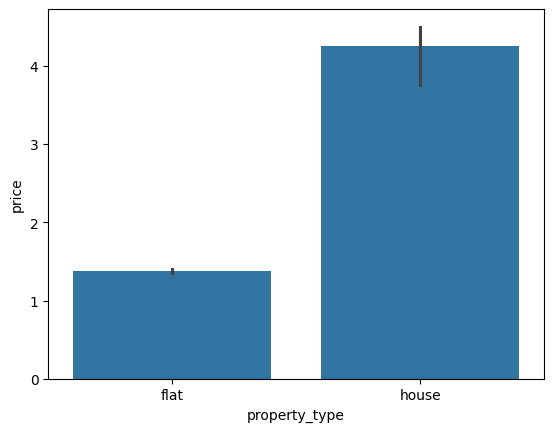

In [124]:
sns.barplot(x=df['property_type'], y=df['price'], estimator=np.median)

<Axes: xlabel='property_type', ylabel='price'>

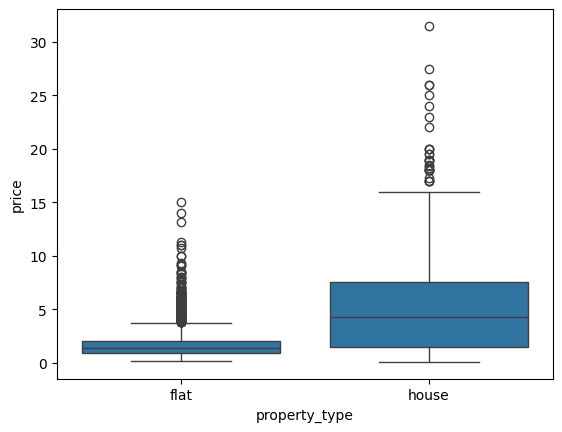

In [130]:
sns.boxplot(x=df['property_type'], y=df['price'])

# property_type vs buildup_area

<Axes: xlabel='property_type', ylabel='built_up_area'>

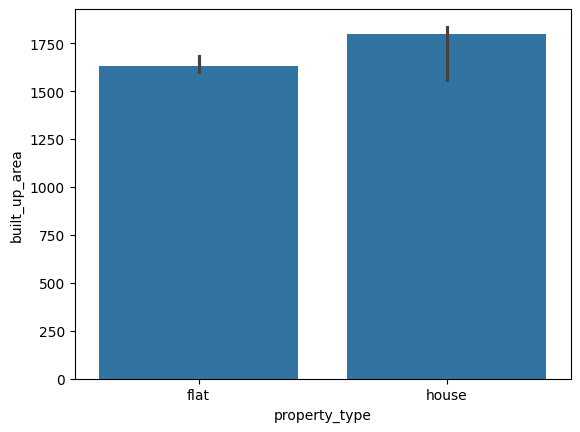

In [131]:
sns.barplot(x=df['property_type'], y=df['built_up_area'], estimator=np.median)

<Axes: xlabel='property_type', ylabel='built_up_area'>

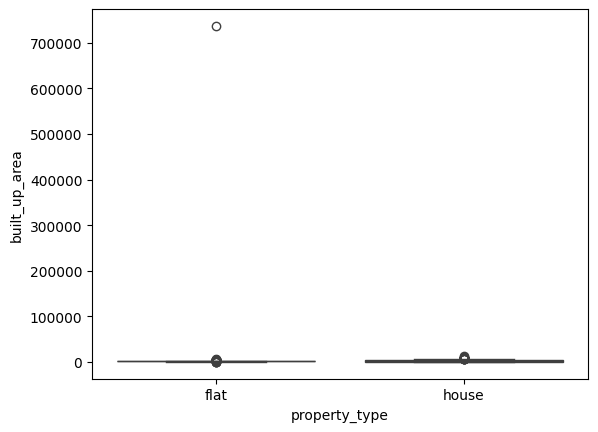

In [132]:
sns.boxplot(x=df['property_type'], y=df['built_up_area'])

In [135]:
# removing that outlier
df = df[df['built_up_area'] != 737144] #just put any value greater than 700000

<Axes: xlabel='property_type', ylabel='built_up_area'>

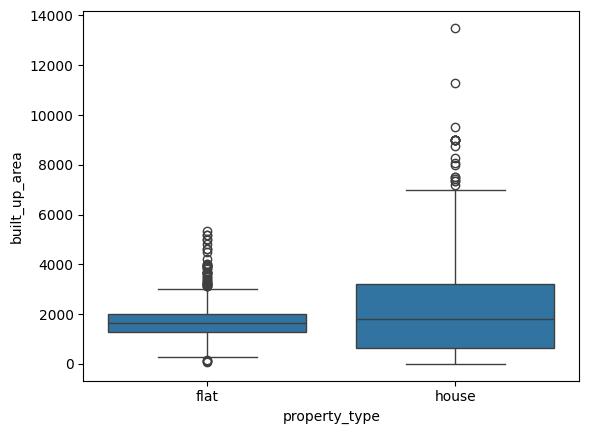

In [136]:
sns.boxplot(x=df['property_type'], y=df['built_up_area'])

### property_type vs price_per_sqft

<Axes: xlabel='property_type', ylabel='price_per_sqft'>

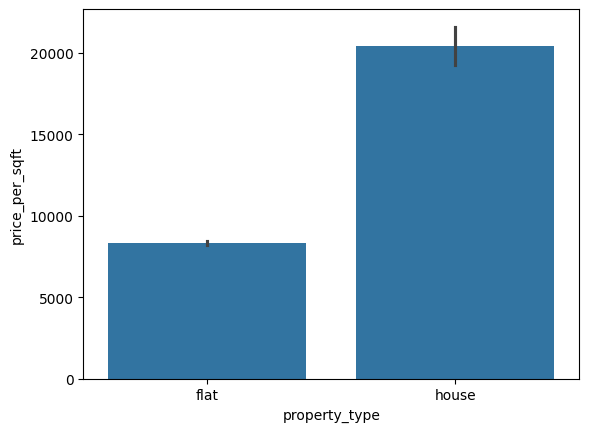

In [137]:
sns.barplot(x=df['property_type'], y=df['price_per_sqft'], estimator=np.median)

<Axes: xlabel='property_type', ylabel='price_per_sqft'>

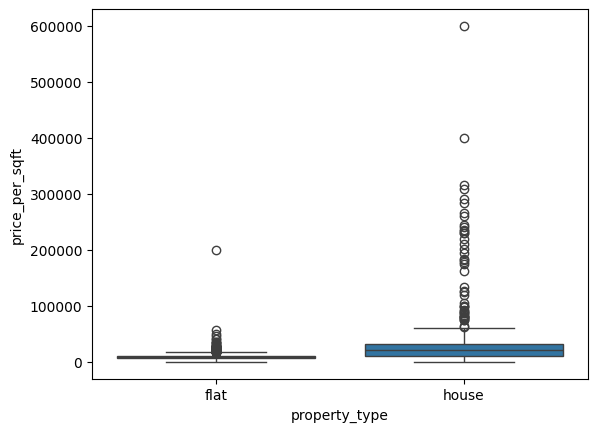

In [138]:
sns.boxplot(x=df['property_type'], y=df['price_per_sqft'])

In [139]:
# check outliers
df[df['price_per_sqft'] > 100000][['property_type','society','sector','price','price_per_sqft','area','areaWithType', 'super_built_up_area', 'built_up_area', 'carpet_area']]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,super_built_up_area,built_up_area,carpet_area
121,house,independent,sector 28,4.50,125000.0,360.0,Built Up area: 360 (33.45 sq.m.),NaN,360.0,NaN
421,house,unitech nirvana birch court,sector 50,7.10,283333.0,251.0,Plot area 240(22.3 sq.m.),NaN,240.0,NaN
449,house,independent,sector 23,2.80,161849.0,173.0,Plot area 173(16.07 sq.m.)Built Up area: 160 s...,NaN,160.0,150.0
574,house,independent,sector 4,0.60,105263.0,57.0,Plot area 57(5.3 sq.m.),NaN,57.0,NaN
681,house,"bhim nagar, sector 6",sector 6,0.85,126865.0,67.0,Plot area 67(6.22 sq.m.),NaN,67.0,NaN
752,house,vipul tatvam villa,sector 48,7.25,201388.0,360.0,Plot area 360(33.45 sq.m.),NaN,360.0,NaN
936,house,independent,sector 55,1.45,241666.0,60.0,Plot area 60(5.57 sq.m.),NaN,60.0,NaN
964,house,uppal southend,sector 49,6.75,290948.0,232.0,Plot area 232(21.55 sq.m.),NaN,232.0,NaN
991,house,rk excelo,sector 12,0.60,120000.0,50.0,Plot area 50(4.65 sq.m.)Built Up area: 30 sq.f...,NaN,30.0,15.0
1145,house,ansal,sector 43,1.85,308333.0,60.0,Plot area 60(5.57 sq.m.),NaN,60.0,NaN


In [140]:
df.head(4)

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
0,flat,ss the leaf,sector 85,1.20,12371.0,970.010508,Super Built up area 1671(155.24 sq.m.)Built Up...,2.0,2.0,2,4.0,East,Relatively New,1671.0,1190.0,970.0,0.0,1.0,1.0,0.0,0.0,1,81
1,flat,tulip purple,sector 69,1.80,9000.0,2000.000000,Super Built up area 2400(222.97 sq.m.)Built Up...,4.0,5.0,3+,4.0,North-East,Relatively New,2400.0,2200.0,2000.0,0.0,1.0,0.0,0.0,0.0,1,165
2,flat,umang monsoon breeze,sector 78,1.15,5284.0,2176.381529,Super Built up area 2176(202.16 sq.m.),3.0,3.0,3,9.0,NA,Moderately Old,2176.0,NaN,NaN,0.0,1.0,0.0,0.0,1.0,1,22
3,house,independent,sector 7,2.25,16892.0,1332.000000,Built Up area: 148 (123.75 sq.m.),5.0,3.0,0,2.0,NA,Undefined,NaN,148.0,NaN,0.0,0.0,0.0,0.0,0.0,1,0


# analysis of house and flat with bedrooms

<Axes: xlabel='bedRoom', ylabel='property_type'>

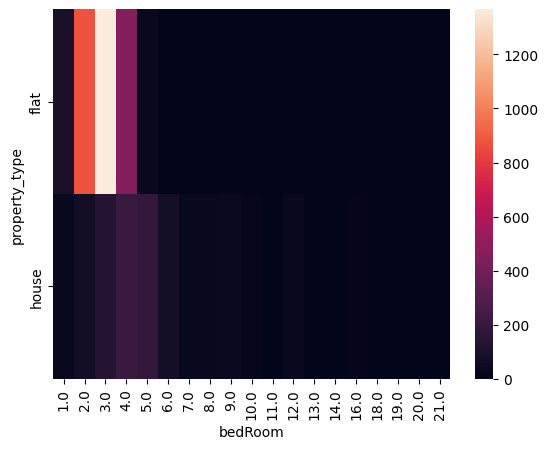

In [144]:
sns.heatmap(pd.crosstab(df['property_type'],df['bedRoom']))

In [145]:
# checking outliers
df[df['bedRoom'] >= 10]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
135,house,independent,sector 25,NaN,NaN,NaN,Plot area 250(209.03 sq.m.)Built Up area: 260 ...,12.0,12.0,3+,4.0,North-East,New Property,NaN,260.0,245.0,1.0,1.0,0.0,1.0,1.0,2,144
160,house,independent,sector 46,6.81,36911.0,1845.0,Plot area 205(171.41 sq.m.),12.0,14.0,3+,NaN,East,New Property,NaN,1845.0,NaN,0.0,1.0,0.0,0.0,1.0,0,40
209,house,dlf city phase 1,sector 26,9.25,47803.0,1935.0,Plot area 1935(179.77 sq.m.)Built Up area: 700...,12.0,12.0,3+,4.0,North-East,New Property,NaN,7000.0,NaN,0.0,1.0,0.0,1.0,0.0,0,43
297,house,independent,sector 13,9.00,100000.0,900.0,Plot area 900(83.61 sq.m.),10.0,5.0,3+,4.0,NA,Old Property,NaN,900.0,NaN,0.0,0.0,0.0,0.0,0.0,1,0
314,house,independent,sector 13,1.50,11538.0,1300.0,Plot area 1300(120.77 sq.m.),10.0,7.0,3,4.0,East,Moderately Old,NaN,1300.0,NaN,0.0,0.0,0.0,0.0,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3587,house,independent,sector 40,9.50,40135.0,2367.0,Plot area 263(219.9 sq.m.),12.0,12.0,3+,4.0,NA,New Property,NaN,2367.0,NaN,0.0,0.0,1.0,0.0,0.0,0,57
3640,house,independent,sector 43,4.50,39062.0,1152.0,Plot area 128(107.02 sq.m.),20.0,20.0,3+,4.0,East,Relatively New,NaN,1152.0,NaN,0.0,1.0,0.0,0.0,0.0,2,22
3649,house,independent,sector 28,11.00,33951.0,3240.0,Plot area 360(301.01 sq.m.),13.0,13.0,3+,3.0,East,Relatively New,NaN,3240.0,NaN,1.0,1.0,0.0,1.0,0.0,2,122
3661,house,independent,sector 27,8.25,45833.0,1800.0,Plot area 210(175.59 sq.m.)Built Up area: 205 ...,12.0,12.0,3+,4.0,East,New Property,NaN,205.0,200.0,0.0,1.0,0.0,1.0,0.0,0,40


<Axes: xlabel='property_type', ylabel='floorNum'>

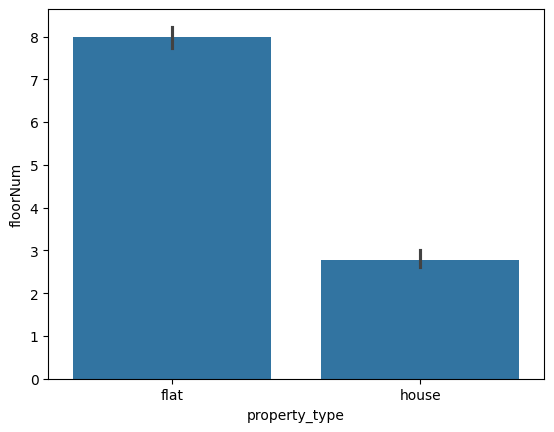

In [146]:
sns.barplot(x=df['property_type'],y=df['floorNum'])

<Axes: xlabel='property_type', ylabel='floorNum'>

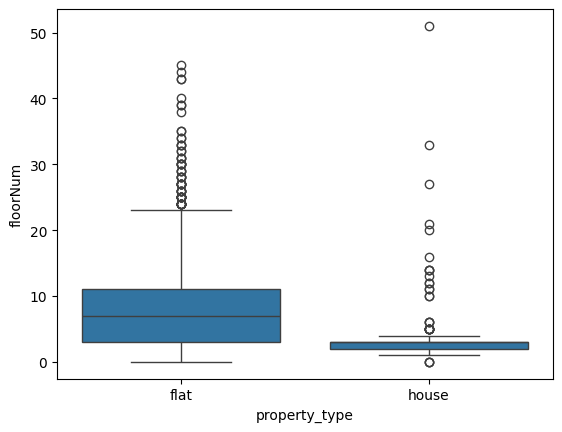

In [147]:
sns.boxplot(x=df['property_type'],y=df['floorNum'])

In [148]:
# checking for outliers
df[(df['property_type'] == 'house') & (df['floorNum'] > 10)]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
423,house,independent,sector 92,1.80,7627.0,2360.0,Built Up area: 2360 (219.25 sq.m.),4.0,5.0,0,13.0,NA,Undefined,NaN,2360.0,NaN,0.0,0.0,0.0,0.0,0.0,1,0
1074,house,godrej meridien,sector 106,5.60,14000.0,4000.0,Plot area 4000(371.61 sq.m.),5.0,4.0,3+,33.0,North-East,New Property,NaN,4000.0,NaN,1.0,1.0,1.0,1.0,0.0,1,151
1467,house,suncity township,sector 54,2.00,30968.0,646.0,Plot area 60Built Up area: 60 sq.m.Carpet area...,9.0,9.0,3,11.0,North,Relatively New,NaN,60.0,59.0,0.0,1.0,0.0,0.0,0.0,2,7
2700,house,ats tourmaline,sector 109,1.87,8697.0,2150.0,Built Up area: 2150 (199.74 sq.m.),3.0,4.0,0,12.0,NA,Undefined,NaN,2150.0,NaN,0.0,0.0,0.0,0.0,0.0,1,0
2843,house,ninex city,sector 76,1.75,6250.0,2800.0,Carpet area: 2800 (260.13 sq.m.),4.0,4.0,0,14.0,NA,Undefined,NaN,NaN,2800.0,0.0,0.0,0.0,0.0,0.0,1,0
2862,house,spaze privy,sector 72,3.09,6981.0,4426.0,Built Up area: 3653 (339.37 sq.m.)Carpet area:...,5.0,5.0,3+,14.0,East,Relatively New,NaN,3653.0,2922.0,0.0,1.0,0.0,0.0,0.0,0,33
3255,house,greenopolis,sector 89,0.70,5397.0,1297.0,Built Up area: 1297 (120.5 sq.m.),2.0,2.0,2,14.0,North-East,Undefined,NaN,1297.0,NaN,0.0,0.0,0.0,0.0,0.0,1,0
3319,house,vatika the seven lamps,sector 82,1.60,6597.0,2425.0,Plot area 2425(225.29 sq.m.),4.0,4.0,3+,16.0,North,Moderately Old,NaN,2425.0,NaN,0.0,1.0,0.0,0.0,0.0,1,94
3391,house,suncity avenue 76,sector 76,0.75,10067.0,745.0,Plot area 745(69.21 sq.m.)Built Up area: 745 s...,2.0,2.0,2,11.0,North-East,New Property,NaN,745.0,NaN,0.0,0.0,0.0,0.0,0.0,1,40
3425,house,indiabulls centrum park,sector 103,3.25,8125.0,4000.0,Plot area 4000(371.61 sq.m.),4.0,3.0,3+,20.0,NA,Under Construction,NaN,4000.0,NaN,0.0,0.0,0.0,0.0,0.0,1,51


# conclusion: houses(villa) but in appartments


<Axes: xlabel='agePossession', ylabel='property_type'>

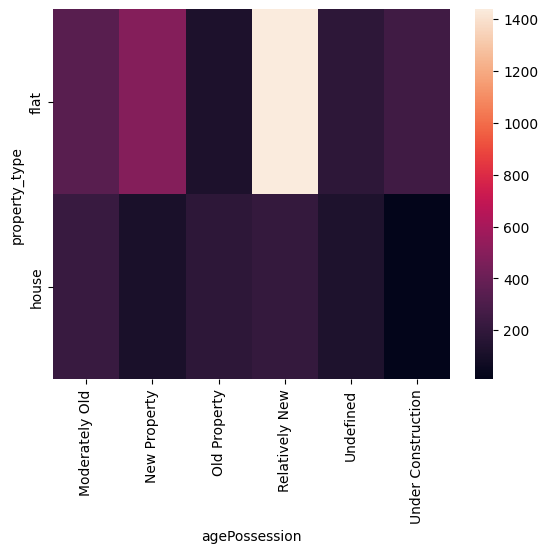

In [149]:
sns.heatmap(pd.crosstab(df['property_type'],df['agePossession']))

<Axes: xlabel='agePossession', ylabel='property_type'>

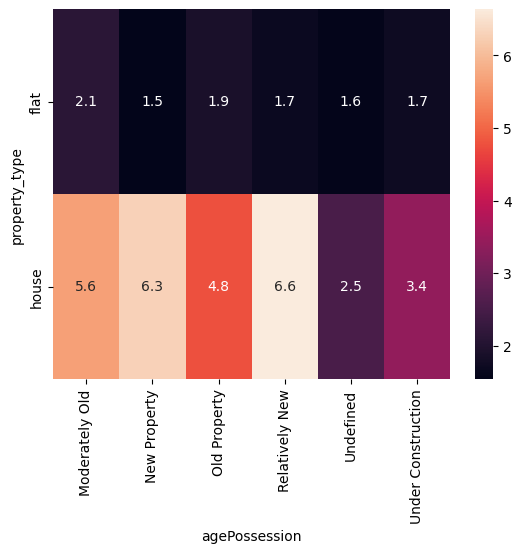

In [150]:
sns.heatmap(pd.pivot_table(df,index='property_type',columns='agePossession',values='price',aggfunc='mean'),annot=True)

<Axes: xlabel='bedRoom', ylabel='property_type'>

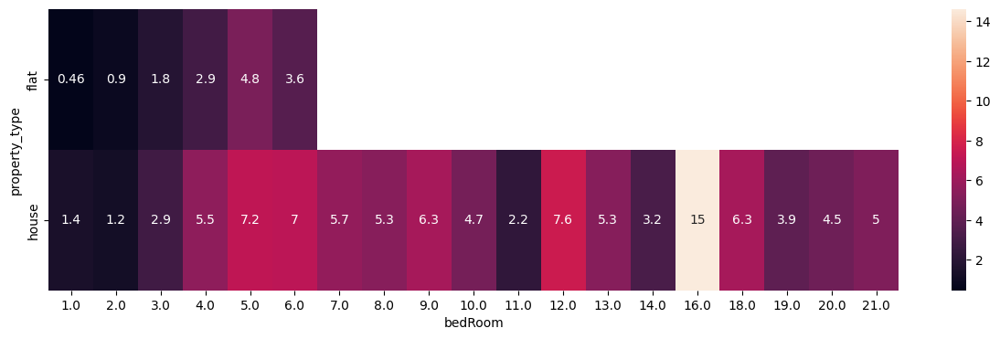

In [151]:
plt.figure(figsize=(15,4))
sns.heatmap(pd.pivot_table(df,index='property_type',columns='bedRoom',values='price',aggfunc='mean'),annot=True)

<Axes: xlabel='furnishing_type', ylabel='property_type'>

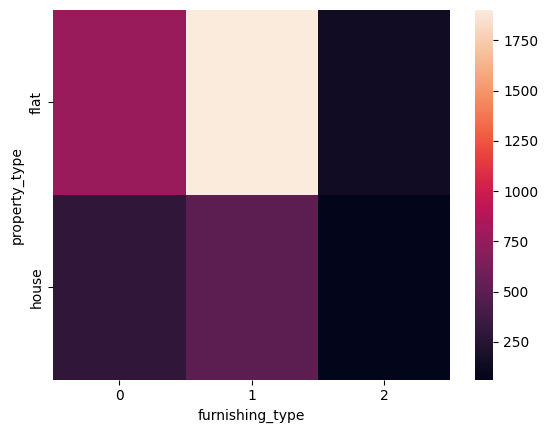

In [152]:
sns.heatmap(pd.crosstab(df['property_type'],df['furnishing_type']))

<Axes: xlabel='furnishing_type', ylabel='property_type'>

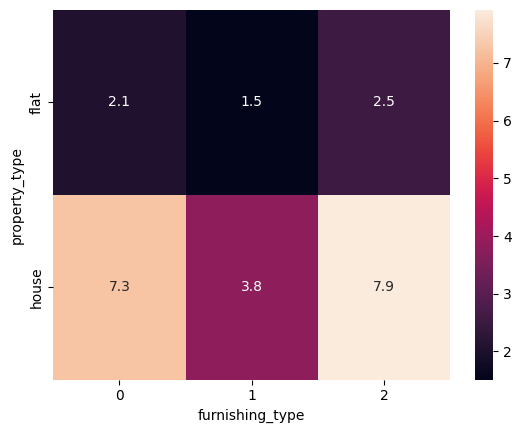

In [153]:
sns.heatmap(pd.pivot_table(df,index='property_type',columns='furnishing_type',values='price',aggfunc='mean'),annot=True)

<Axes: xlabel='property_type', ylabel='luxury_score'>

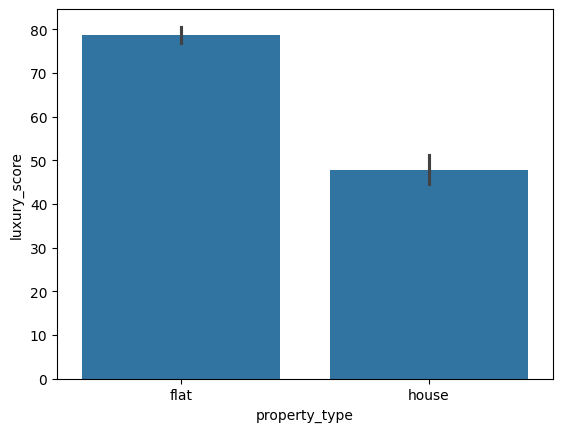

In [154]:
sns.barplot(x=df['property_type'],y=df['luxury_score'])

<Axes: xlabel='property_type', ylabel='luxury_score'>

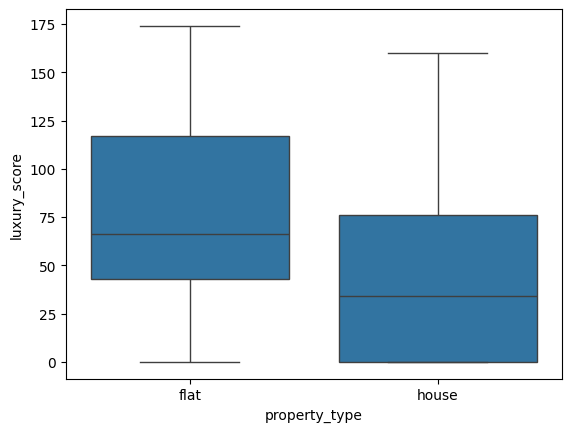

In [155]:
sns.boxplot(x=df['property_type'],y=df['luxury_score'])

<Axes: xlabel='sector', ylabel='property_type'>

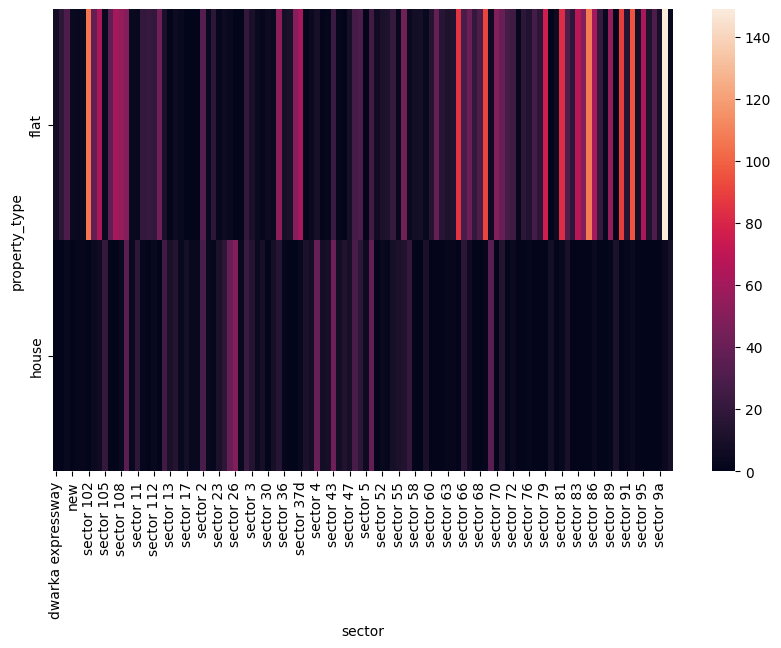

In [157]:
# sector analysis
plt.figure(figsize=(10,6))
sns.heatmap(pd.crosstab(df['property_type'],df['sector'].sort_index()))

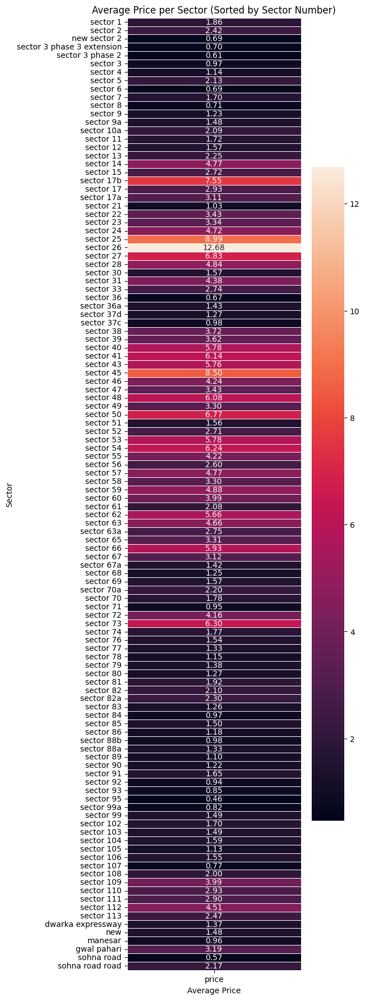

In [161]:
# sector analysis
import re
# Group by 'sector' and calculate the average price
avg_price_per_sector = df.groupby('sector')['price'].mean().reset_index()

# Function to extract sector numbers
def extract_sector_number(sector_name):
    match = re.search(r'\d+', sector_name)
    if match:
        return int(match.group())
    else:
        return float('inf')  # Return a large number for non-numbered sectors

avg_price_per_sector['sector_number'] = avg_price_per_sector['sector'].apply(extract_sector_number)

# Sort by sector number
avg_price_per_sector_sorted_by_sector = avg_price_per_sector.sort_values(by='sector_number')

# Plot the heatmap
plt.figure(figsize=(5, 22))
sns.heatmap(avg_price_per_sector_sorted_by_sector.set_index('sector')[['price']], annot=True, fmt=".2f", linewidths=.5)
plt.title('Average Price per Sector (Sorted by Sector Number)')
plt.xlabel('Average Price')
plt.ylabel('Sector')
plt.show()


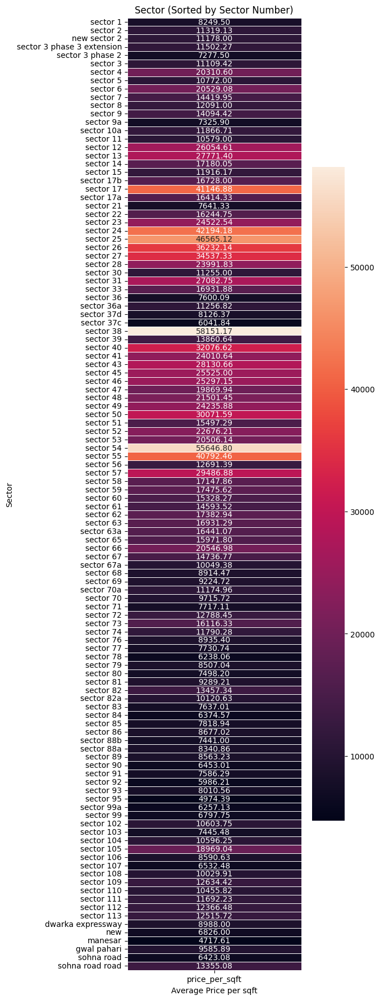

In [162]:
avg_price_per_sqft_sector = df.groupby('sector')['price_per_sqft'].mean().reset_index()

avg_price_per_sqft_sector['sector_number'] = avg_price_per_sqft_sector['sector'].apply(extract_sector_number)

# Sort by sector number
avg_price_per_sqft_sector_sorted_by_sector = avg_price_per_sqft_sector.sort_values(by='sector_number')

# Plot the heatmap
plt.figure(figsize=(5, 22))
sns.heatmap(avg_price_per_sqft_sector_sorted_by_sector.set_index('sector')[['price_per_sqft']], annot=True, fmt=".2f", linewidths=.5)
plt.title('Sector (Sorted by Sector Number)')
plt.xlabel('Average Price per sqft')
plt.ylabel('Sector')
plt.show()

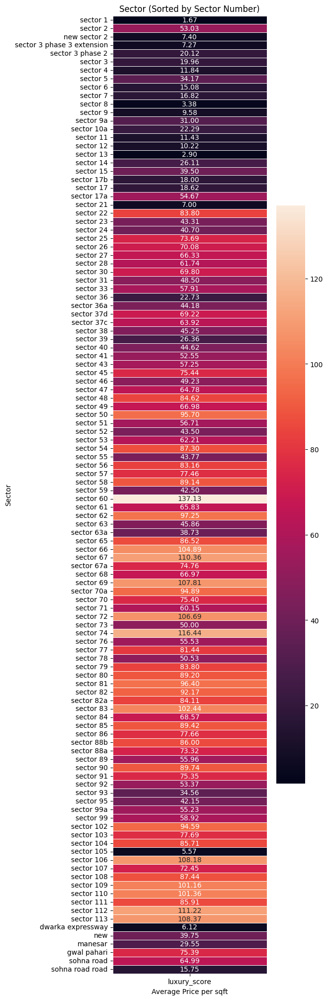

In [163]:
luxury_score = df.groupby('sector')['luxury_score'].mean().reset_index()

luxury_score['sector_number'] = luxury_score['sector'].apply(extract_sector_number)

# Sort by sector number
luxury_score_sector = luxury_score.sort_values(by='sector_number')

# Plot the heatmap
plt.figure(figsize=(5, 25))
sns.heatmap(luxury_score_sector.set_index('sector')[['luxury_score']], annot=True, fmt=".2f", linewidths=.5)
plt.title('Sector (Sorted by Sector Number)')
plt.xlabel('Average Price per sqft')
plt.ylabel('Sector')
plt.show()

In [165]:
df.head(2)

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
0,flat,ss the leaf,sector 85,1.2,12371.0,970.010508,Super Built up area 1671(155.24 sq.m.)Built Up...,2.0,2.0,2,4.0,East,Relatively New,1671.0,1190.0,970.0,0.0,1.0,1.0,0.0,0.0,1,81
1,flat,tulip purple,sector 69,1.8,9000.0,2000.000000,Super Built up area 2400(222.97 sq.m.)Built Up...,4.0,5.0,3+,4.0,North-East,Relatively New,2400.0,2200.0,2000.0,0.0,1.0,0.0,0.0,0.0,1,165


# Analysis for Price

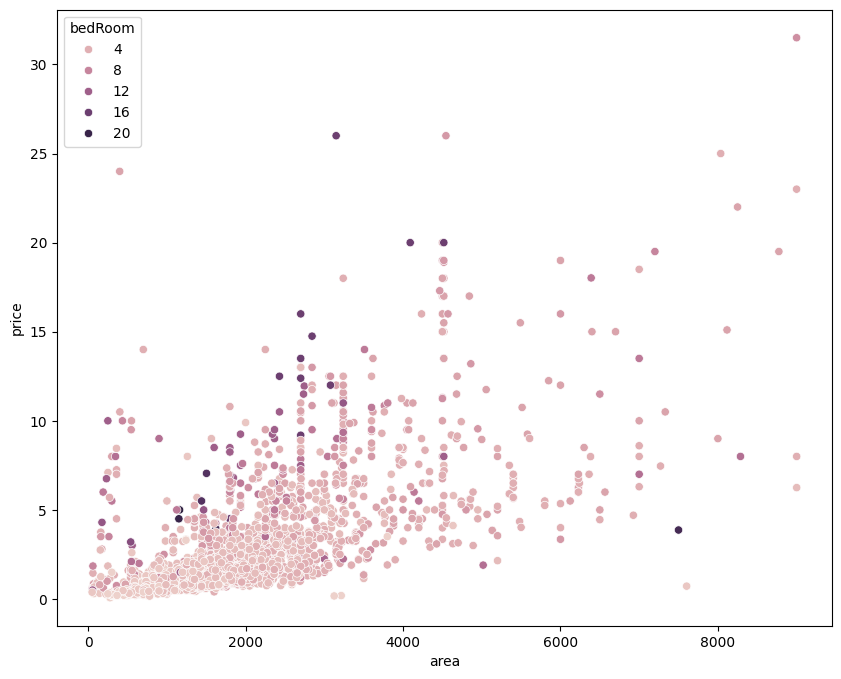

In [167]:

plt.figure(figsize=(10, 8))
sns.scatterplot(data=df[df['area'] < 10000], x='area', y='price', hue='bedRoom')
plt.show()


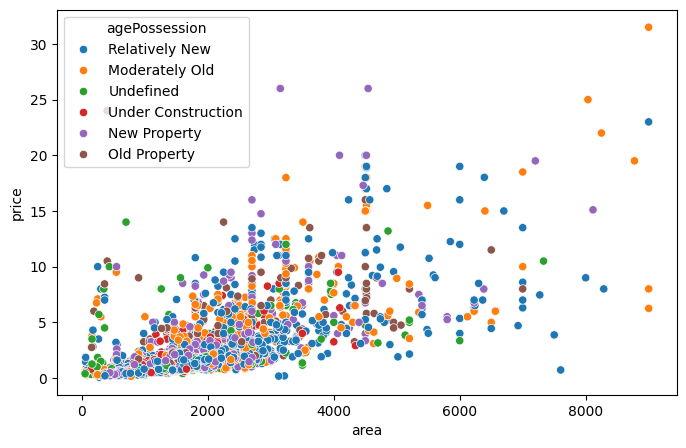

In [173]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df[df['area'] < 10000], x='area', y='price', hue='agePossession')
plt.show()


<Axes: xlabel='area', ylabel='price'>

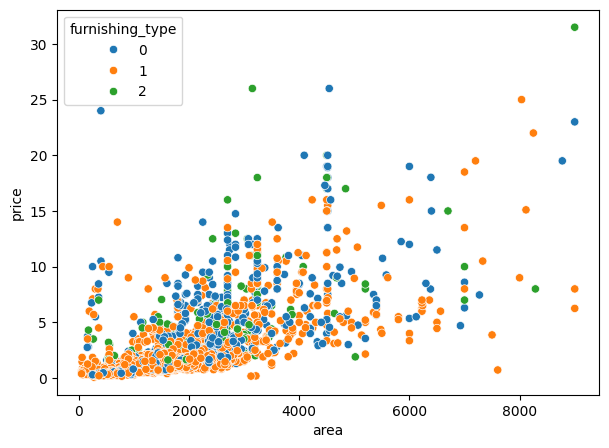

In [175]:
plt.figure(figsize=(7,5))
sns.scatterplot(df[df['area']<10000],x='area',y='price',hue=df['furnishing_type'].astype('category'))

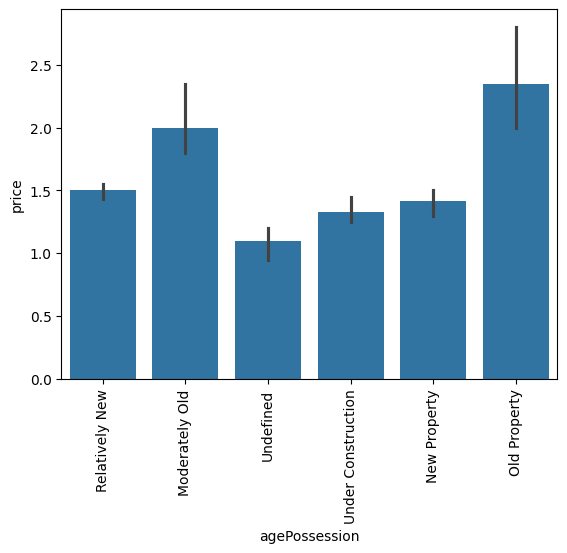

In [177]:
sns.barplot(x=df['agePossession'],y=df['price'],estimator=np.median)
plt.xticks(rotation='vertical')
plt.show()

<Axes: xlabel='bedRoom', ylabel='price'>

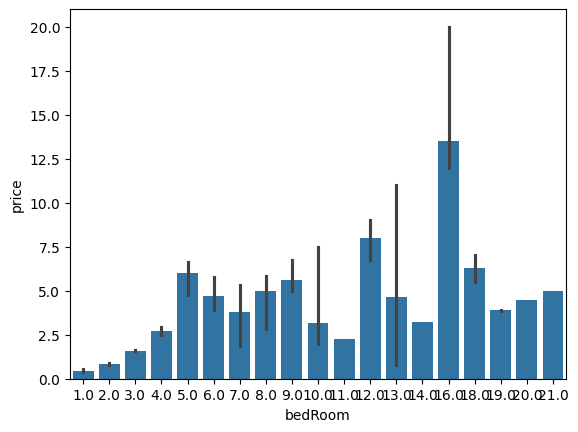

In [176]:
sns.barplot(x=df['bedRoom'],y=df['price'],estimator=np.median)

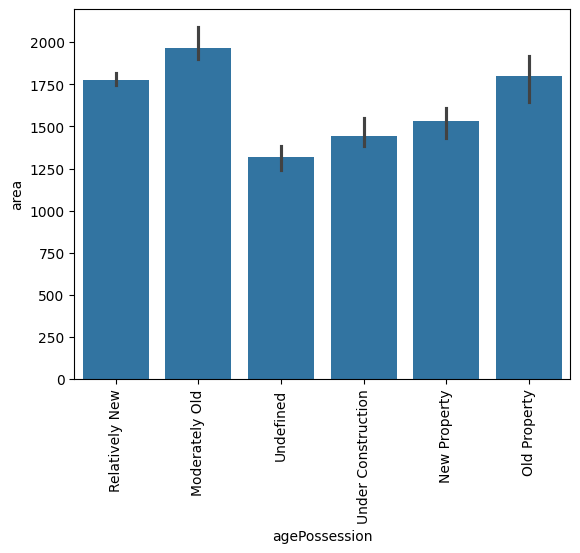

In [178]:
sns.barplot(x=df['agePossession'],y=df['area'],estimator=np.median)
plt.xticks(rotation='vertical')
plt.show()

<Axes: xlabel='furnishing_type', ylabel='price'>

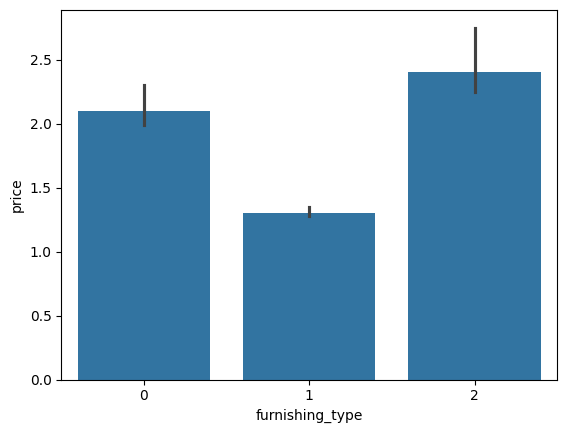

In [179]:
sns.barplot(x=df['furnishing_type'],y=df['price'],estimator=np.median)

<Axes: xlabel='luxury_score', ylabel='price'>

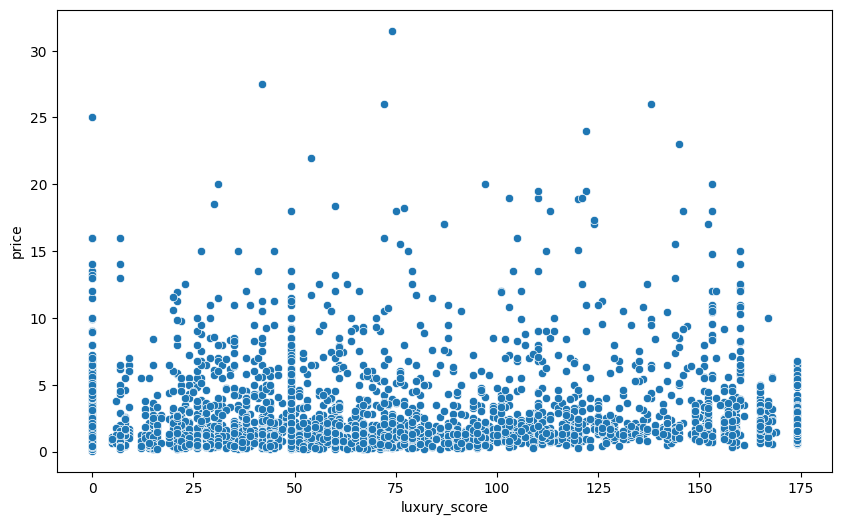

In [181]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['luxury_score'], y=df['price'])

# Corelations analysis

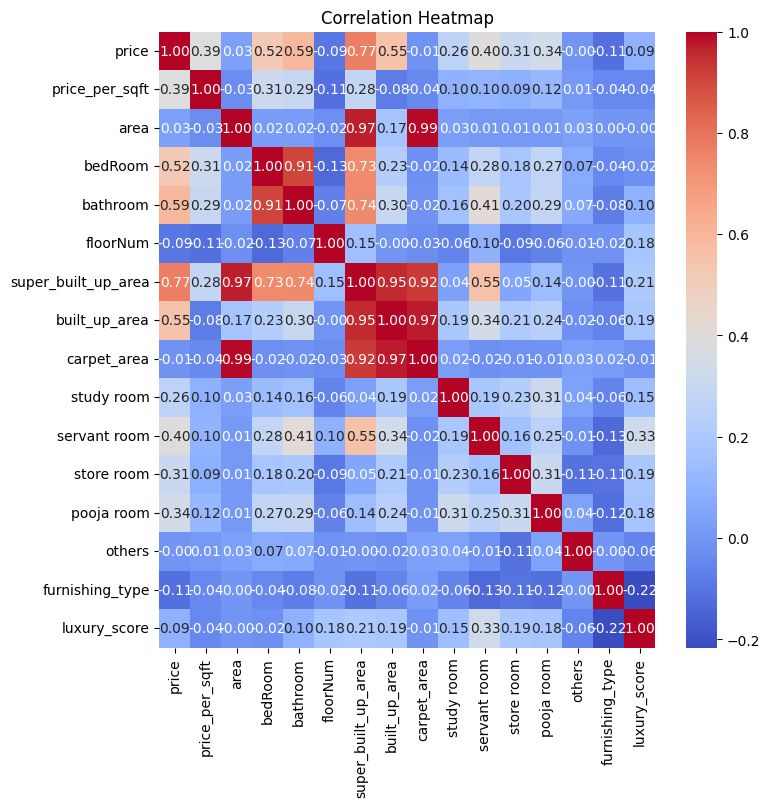

In [183]:
# Select only numeric columns
numeric_df = df.select_dtypes(include='number')

# Create heatmap
plt.figure(figsize=(8, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


In [185]:
numeric_df = df.select_dtypes(include='number')
numeric_df.corr()['price'].sort_values(ascending=False)

price                  1.000000
super_built_up_area    0.769412
bathroom               0.589797
built_up_area          0.551405
bedRoom                0.522893
servant room           0.400937
price_per_sqft         0.391262
pooja room             0.341507
store room             0.309133
study room             0.258620
luxury_score           0.094795
area                   0.034718
others                -0.003505
carpet_area           -0.011344
floorNum              -0.094235
furnishing_type       -0.113609
Name: price, dtype: float64

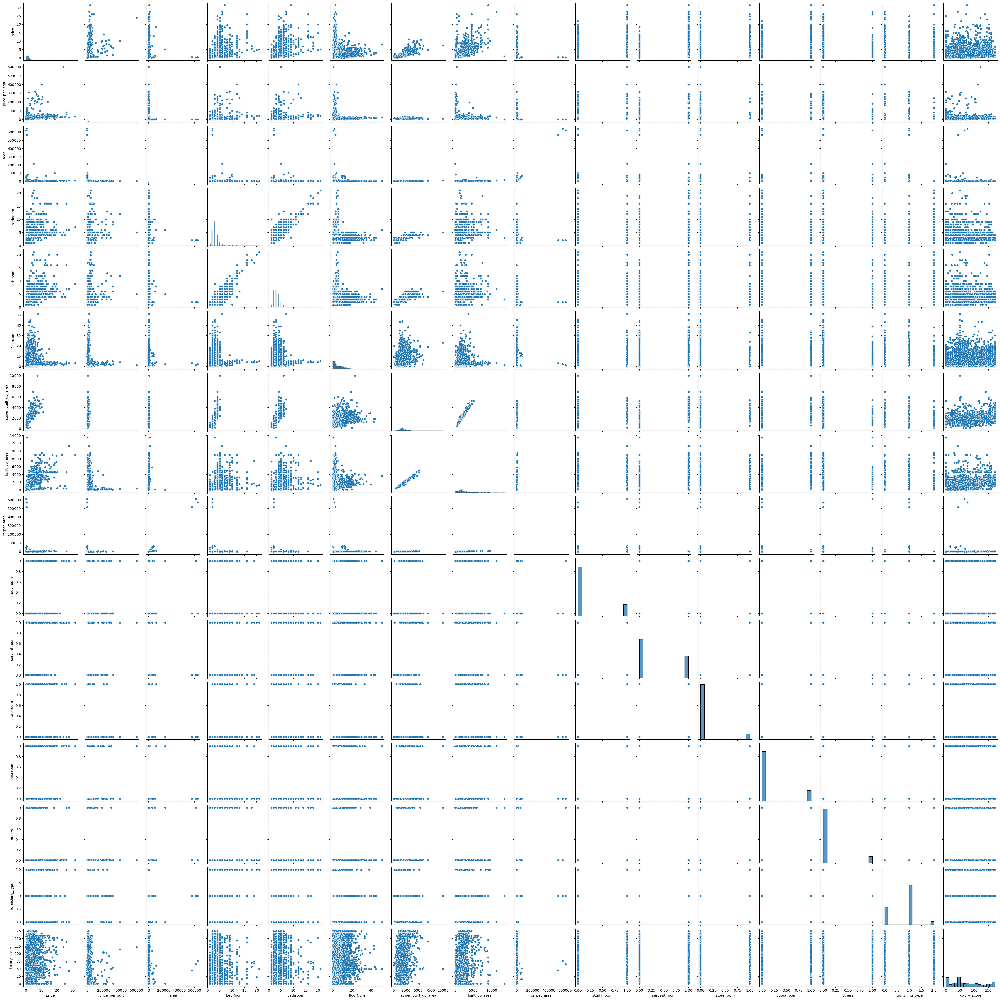

In [186]:
sns.pairplot(df)

# EDA using Pandas profiling

In [194]:
! pip install pandas-profiling

In [196]:
! pip install pydantic-settings

In [199]:
from pydantic_settings import BaseSettings

In [200]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     | 17.8 MB 4.1 MB/s 0:00:04m0m
  Preparing metadata (setup.py) ... done
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=357942 sha256=9d8f4e7326f1ba81f974e67192a8d25b69bf6c29dd5a4b471e52884b5b6b7b27
  Stored in directory: /private/var/folders/3t/5qtlv2451k3fkqv9ls22lmg00000gn/T/pip-ephem-wheel-cache-8svle4hx/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
Successfully built ydata-profiling
  Attempting uninstall: ydata-profiling
    Found existing installation: ydata-profiling 4.7.0
    Uninstalling ydata-profiling-4.7.0:
      Successfully uninstalled ydata-profiling-4.7.0


In [201]:
from pandas_profiling import ProfileReport

/Users/ravina/Desktop/RealEstateProject/realestatevenv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/var/folders/3t/5qtlv2451k3fkqv9ls22lmg00000gn/T/ipykernel_30884/2274191625.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [202]:

# Create the ProfileReport object
profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)

# Generate the report
profile.to_file("output_report.html")


Summarize dataset:  83%|████████▎ | 25/30 [00:00<00:00, 137.01it/s, Calculate auto correlation]          /Users/ravina/Desktop/RealEstateProject/realestatevenv/lib/python3.10/site-packages/ydata_profiling/model/correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Relatively New'')
  warnings.warn(
Export report to file: 100%|██████████| 1/1 [00:00<00:00, 164.17it/s]


In [206]:
! pip install ipywidgets


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 697.6 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 215.0/215.0 kB 1.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 5.3 MB/s eta 0:00:0000:0100:01


In [208]:
! jupyter nbextension enable --py widgetsnbextension


Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.10/bin/jupyter-nbextension", line 8, in <module>
    sys.exit(main())
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/jupyter_core/application.py", line 269, in launch_instance
    return super().launch_instance(argv=argv, **kwargs)
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/traitlets/config/application.py", line 978, in launch_instance
    app.start()
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/notebook/nbextensions.py", line 972, in start
    super().start()
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/jupyter_core/application.py", line 258, in start
    self.subapp.start()
  File "/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/notebook/nbextensions.py", line 882, in start
    self.toggle_nbex

In [209]:
ProfileReport(df, title='Pandas Profiling Report', explorative=True)

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]
